# Evaluating biophysically detailed multi-compartmental models

[Tutorial 1.1: Simulating biophysically detailed multi-compartmental models](./1.1%20Simulation.ipynb) outlined how to run 5 stimulus protocols ($bAP$, $BAC$ and $3$ step currents) in-silico.

This tutorial will show how to use ISF in order to compare the cell's in-silico response to an empirical distribution of electrophysiological parameters, i.e. the simulation **objectives**. Quantifying how far off the responses are compared to this distribution will be done with the [`Evaluator`](../../../biophysics_fitting/evaluator.py) object.

In addition to quantifying the response and comparing it to empirical values, this tutorial will also show how to visually inspect simulations using the [visualize](../../../visualize/__init__.py) package.

In [1]:
import Interface as I
from getting_started import example_data_dir

[INFO] distributed_lock: trying to connect to distributed locking server {'config': {'hosts': 'somalogin02:33333'}, 'type': 'zookeeper'}
[INFO] distributed_lock: success!
[INFO] l5pt: Loading mechanisms:
[WARNING] somatic_summation_model: Deprecation warning: This module is deprecated and will be removed in a future release.
[INFO] ISF: Current version: heads/docs+0.gadcd56d2.dirty
[INFO] ISF: Current pid: 186791


--No graphics will be displayed.


[ATTENTION] ISF: The source folder has uncommited changes!
[WARNING] ISF: Could not load linked views



[INFO] ISF: Loaded modules with __version__ attribute are:
IPython: 8.12.2, Interface: heads/docs+0.gadcd56d2.dirty, PIL: 10.4.0, _brotli: 1.0.9, _csv: 1.0, _ctypes: 1.1.0, _curses: b'2.2', _decimal: 1.70, argparse: 1.1, backcall: 0.2.0, blosc: 1.11.1, bluepyopt: 1.9.126, brotli: 1.0.9, certifi: 2024.08.30, cffi: 1.17.0, charset_normalizer: 3.4.0, click: 7.1.2, cloudpickle: 3.1.0, colorama: 0.4.6, comm: 0.2.2, csv: 1.0, ctypes: 1.1.0, cycler: 0.12.1, cytoolz: 0.12.3, dash: 2.18.2, dask: 2.30.0, dateutil: 2.9.0, deap: 1.4, debugpy: 1.8.5, decimal: 1.70, decorator: 5.1.1, defusedxml: 0.7.1, distributed: 2.30.0, distutils: 3.8.20, django: 1.8.19, entrypoints: 0.4, executing: 2.1.0, fasteners: 0.17.3, flask: 1.1.4, fsspec: 2024.10.0, future: 1.0.0, greenlet: 3.1.1, idna: 3.10, ipaddress: 1.0, ipykernel: 6.29.5, ipywidgets: 8.1.5, itsdangerous: 1.1.0, jedi: 0.19.1, jinja2: 2.11.3, joblib

The [previous tutorial](./1.1%20Simulation.ipynb) showed how to set up a Simulator object, which we saved to re-use here. Let's load it back in to evaluate how well these models have performed

In [2]:
db_path = I.os.path.join(example_data_dir, 'simulation_data', 'biophysics')
db = I.DataBase(db_path)

In [3]:
simulator = db['simulator']
voltage_traces = db['voltage_traces']

In [4]:
from biophysics_fitting.hay_complete_default_setup import get_Evaluator

evaluator = get_Evaluator(step=True, interpolate_voltage_trace=False)

In [5]:
evaluation = evaluator.evaluate(voltage_traces)
evaluation

[WARNING] hay_evaluation: Setting up hay evaluator. This loads several variables to the NEURON environment. Also, it creates an unconnected cell (which is very small ~ 1 compartment) which has the purpose to 'just be there' such that the functionality necessary to evaluate voltage traces is available. This has the side effect that in the case of the variable time step solver, the timesteps can be changed.
[WARNING] hay_evaluation: Setting up hay evaluator. This loads several variables to the NEURON environment. Also, it creates an unconnected cell (which is very small ~ 1 compartment) which has the purpose to 'just be there' such that the functionality necessary to evaluate voltage traces is available. This has the side effect that in the case of the variable time step solver, the timesteps can be changed.
[WARNING] hay_evaluation: Setting up hay evaluator. This loads several variables to the NEURON environment. Also, it creates an unconnected cell (which is very small ~ 1 compartment)

{'BAC_ahpdepth': 0.14125418811813617,
 'BAC_APheight': 1.0076193107997482,
 'BAC_ISI': 0.0417182547544436,
 'BAC_caSpike_height': 0.659560205506027,
 'BAC_caSpike_width': 0.08894764532934432,
 'BAC_spikecount': 0.0,
 'bAP_spikecount': 0.0,
 'bAP_APheight': 1.7265778138894916,
 'bAP_APwidth': 2.06628632228842,
 'bAP_att2': 1.2392743531680608,
 'bAP_att3': 1.6065100454922565,
 'mf1': 1.7045454545454546,
 'AI1': 0.49272740969831885,
 'ISIcv1': 1.5149115878350792,
 'DI1': 0.42387678054719374,
 'TTFS1': 1.559524119613254,
 'APh1': 0.7270461042321147,
 'fAHPd1': 1.8012804269742928,
 'sAHPd1': 1.014632577988536,
 'sAHPt1': 0.44621364517478956,
 'APw1': 2.129551711974563,
 'mf2': 0.0,
 'AI2': 1.9222306682333696,
 'ISIcv2': 0.5017877027521275,
 'DI2': 1.4694554157331052,
 'TTFS2': 0.12556975559578443,
 'APh2': 0.9348347507146776,
 'fAHPd2': 1.4198439942151773,
 'sAHPd2': 0.3236920651878746,
 'sAHPt2': 1.1101910558238628,
 'APw2': 1.5216672210411692,
 'mf3': 2.2500225002250023,
 'AI3': 1.6812494

`evaluation` contains a lot of information. Most are self-explanatory, but not all, so here is a small overview.

|Suffix|Meaning|
|---|---|
|`.check`|Check if certain conditions are met before moving on to evaluation. E.g., it does not make sense to measure the AP height of the second AP during the BAC stimulus, if there is no burst firing at all.|
|`.raw`|The measured values for all objectives are saved under `.raw` variables. If multiple values exists for some objective, then this `.raw` value will be an array, but the mean is taken for further evaluation.
|`.normalized`|Scales objective between $0$ and $1$.|
|No suffix|The objective in units of $\sigma$ relative to the empirically observed mean $\mu$.

The step current objectives have some cryptic acronyms as well:

|Acronym|Meaning|
|---|---|
|`mf`|Spike frequency|
|`AI` |Adaptation Index|
|`ISIcv`|Interspike Interval Coefficient of Variation|
|`DI`|Initial burst ISI|
|`TTFS`|First spike latency|
|`APh`|AP peak|
|`fAHPd` |Fast AHP Depth|
|`sAHPd` |Slow AHP Depth|
|`sAHPt` |Slow AHP Time|
|`APw` |AP half-width|

Exactly how much each objective is allowed to deviate from its empirical mean is defined in each evaluator class, associated with a stimulu protocol. See for example the `BAC` class in [hay_evaluation_python](../../../biophysics_fitting/hay_evaluation_python.py)

Let's clean up this data a bit and plot out their deviation from the mean.

In [7]:
# only plot out sigma from mean, not raw or normalized values - also no checks.
filtered_evaluation = {k: v for k, v in evaluation.items() if \
    not k.endswith('.raw') and \
    not k.endswith('.normalized') and \
    not 'check' in k and \
    not k.endswith('err') and\
    not "1BAC" in k}
filtered_evaluation

{'BAC_ahpdepth': 0.14125418811813617,
 'BAC_APheight': 1.0076193107997482,
 'BAC_ISI': 0.0417182547544436,
 'BAC_caSpike_height': 0.659560205506027,
 'BAC_caSpike_width': 0.08894764532934432,
 'BAC_spikecount': 0.0,
 'bAP_spikecount': 0.0,
 'bAP_APheight': 1.7265778138894916,
 'bAP_APwidth': 2.06628632228842,
 'bAP_att2': 1.2392743531680608,
 'bAP_att3': 1.6065100454922565,
 'mf1': 1.7045454545454546,
 'AI1': 0.49272740969831885,
 'ISIcv1': 1.5149115878350792,
 'DI1': 0.42387678054719374,
 'TTFS1': 1.559524119613254,
 'APh1': 0.7270461042321147,
 'fAHPd1': 1.8012804269742928,
 'sAHPd1': 1.014632577988536,
 'sAHPt1': 0.44621364517478956,
 'APw1': 2.129551711974563,
 'mf2': 0.0,
 'AI2': 1.9222306682333696,
 'ISIcv2': 0.5017877027521275,
 'DI2': 1.4694554157331052,
 'TTFS2': 0.12556975559578443,
 'APh2': 0.9348347507146776,
 'fAHPd2': 1.4198439942151773,
 'sAHPd2': 0.3236920651878746,
 'sAHPt2': 1.1101910558238628,
 'APw2': 1.5216672210411692,
 'mf3': 2.2500225002250023,
 'AI3': 1.6812494

In [8]:
def translate_objective(objective):
    """
    A simple map between objective acronyms and their full name
    """
    step_map = {
        'mf': "Spike frequency",
        'AI': 'Adaptation Index',
        'ISIcv': "Interspike Interval \n Coefficient of Variation",
        'DI': "Initial burst ISI",
        'TTFS': "First spike latency",
        'APh': "AP peak",
        'fAHPd': "Fast AHP Depth",
        'sAHPd': "Slow AHP Depth",
        'sAHPt': "Slow AHP Time",
        'APw': "AP half-width",
    }
    if not "bAP" in objective and not "BAC" in objective:
        # must be step current objective
        t = step_map[objective[:-1]]
    else:
        t = objective
    return t

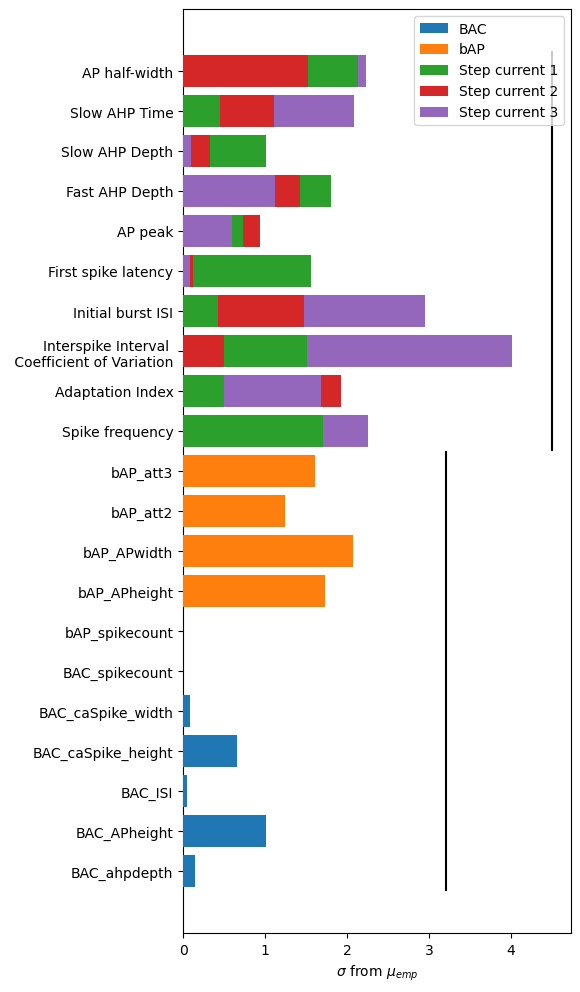

In [13]:
%matplotlib inline
from collections import OrderedDict
colors = I.plt.rcParams['axes.prop_cycle'].by_key()['color']
fig, ax = I.plt.subplots(figsize=(5, 12))

for k, v in filtered_evaluation.items():
    if "BAC" in k:
        label="BAC"
        c = colors[0]
    elif 'bAP' in k:
        label = "bAP"
        c = colors[1]
    else:
        label = "Step current {}".format(k[-1])
        c = colors[int(k[-1])+1]
    ax.barh(y=translate_objective(k), width=v, zorder=5-v, label=label, color=c)

handles, labels = I.plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
I.plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1, 1))

I.plt.vlines([3.2], ymin=-0.5, ymax=10.5, color='k')  # first 10 objectives: bAP and BAC
I.plt.vlines([4.5], ymin=10.5, ymax=20.5, color='k')  # next 10 objectives: step currents

I.plt.xlabel("$\sigma$ from $\mu_{emp}$")
I.plt.show()

All objectives are well within the pre-defined bounds. most are even under $2 \sigma$ from the mean!

## Visualization

How much did current ended up flowing through the ion channels? Let's plot out a spatial integration of all the current types in the apical dendrite. Let's take a $BAC$ current injection as an example simulation.

In [14]:
example_models = db['example_models']
biophysical_parameter_names = [e for e in example_models.columns if "ephys" in e or e == "scale_apical.scale"]
params = example_models[biophysical_parameter_names].iloc[0]

In order to know which currents flow through the membrane, we need to record this. We can configure the simulator to record `range variables` with a `cell_modify_function`:

In [15]:
cell, biophysical_parameters = simulator.setup.get(params)
record_vars = [
    'NaTa_t.ina',
    'Ca_HVA.ica',
    'Ca_LVAst.ica',
    'SKv3_1.ik',
    'SK_E2.ik',
    'Ih.ihcn',
    'Im.ik']

def record_rangevars(cell, params):
    for rv in record_vars:
        cell.record_range_var(rv)
    return cell
    
simulator.setup.cell_modify_funs.append(('BAC.record_range_vars', record_rangevars))
cell, _ = simulator.get_simulated_cell(biophysical_parameters, stim="BAC")

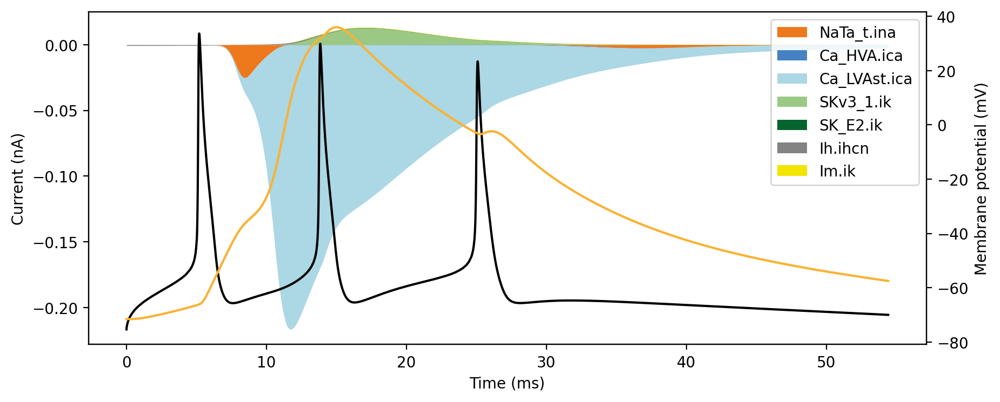

In [17]:
from visualize.current_visualizer import CurrentAnalysis
%matplotlib inline
ca = CurrentAnalysis(cell, rangeVars = record_vars)
ca.plot_areas(plot_voltage = True, t_stim=295)

The black and orange line denote membrane voltage at the soma and dendritic recording location respectively. The filled in areas are a spatial sum of ionic current: $\sum_{dendrites} I_{ion}$

So far, we have only visualized the somatic membrane potential. Now, we create a short animation, where the whole dendrite is visualized (x-axis: soma distance of dendrite segment, y-axis: Vm)

/bin/sh: conda: command not found



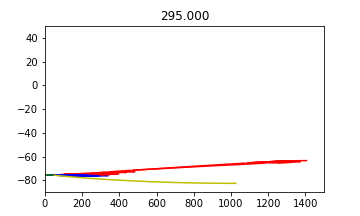
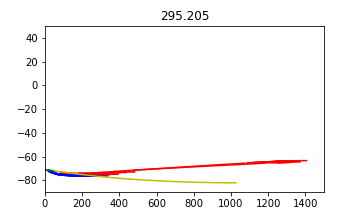
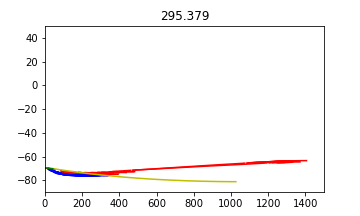
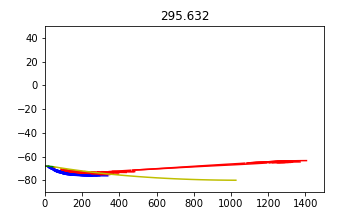
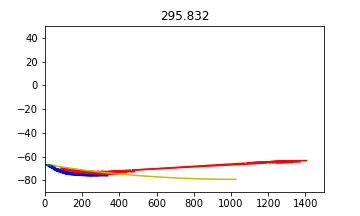
...
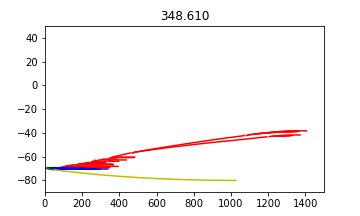
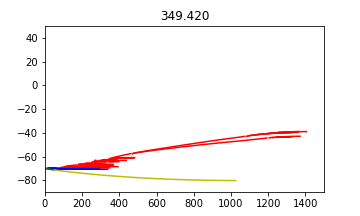
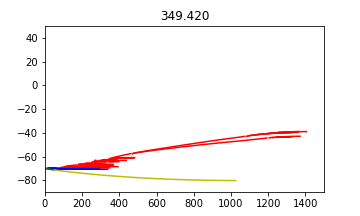
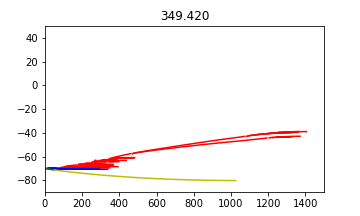
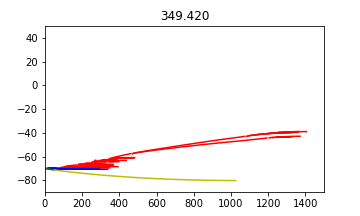

In [22]:
I.logger.setLevel("DEBUG")
if not 'burst_trail_video' in db.keys():
    I.cell_to_animation(
        cell,
        xlim = [0,1500],
        ylim = [-90, 50],
        tstart = 295,
        tend = 350,
        tstep = 0.2,
        outdir = db.create_managed_folder('burst_trail_video'))
I.display_animation(db['burst_trail_video'].join('*', '*.png'), embedded=True);

We can also visualize current through ion channels. Let's have a look at the calcium current through low voltage activated calcium channels:


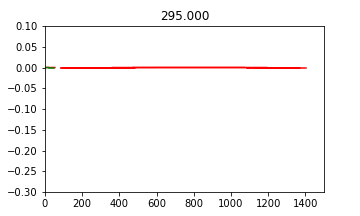
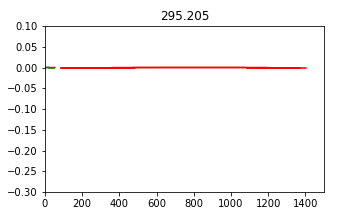
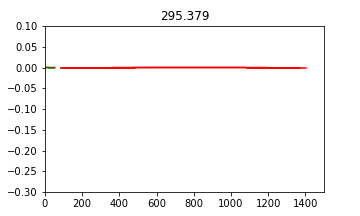
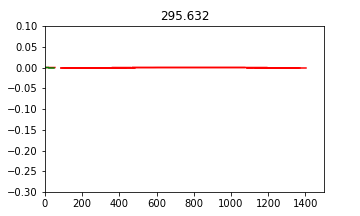
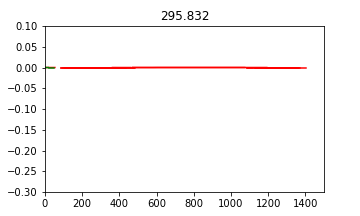
...
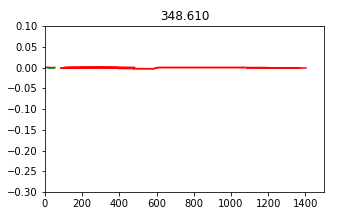
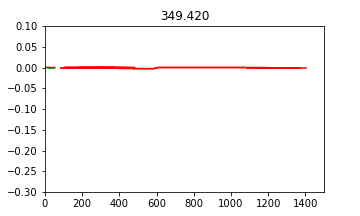
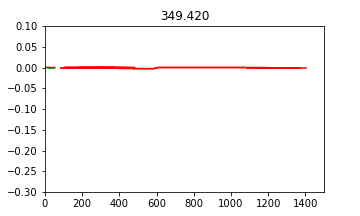
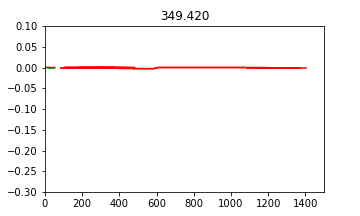
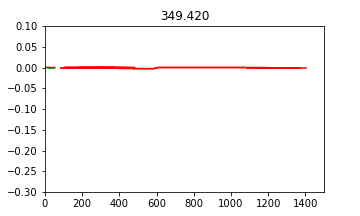

In [24]:
# # to re-create this video, comment out below
# del db['burst_trail_ca_current_video']

if not 'burst_trail_ca_current_video' in db.keys():
    I.cell_to_animation(
        cell,
        xlim = [0,1500],
        ylim = [-0.3, 0.1],
        tstart = 295,
        tend = 350,
        tstep = 0.2,
        outdir = db.create_managed_folder('burst_trail_ca_current_video'),
        range_vars = 'Ca_LVAst.ica')    
I.display_animation(db['burst_trail_ca_current_video'].join('*', '*png'), embedded = True);

If you want to visualize the entire dendritic tree, that's also possible, although a bit slower. Here, we use Dask to parallellize frame generation of the membrane voltage across the entire dendritic tree. You can use the +/- buttons to speed up or slow down the animation, or play around with the t_step parameter


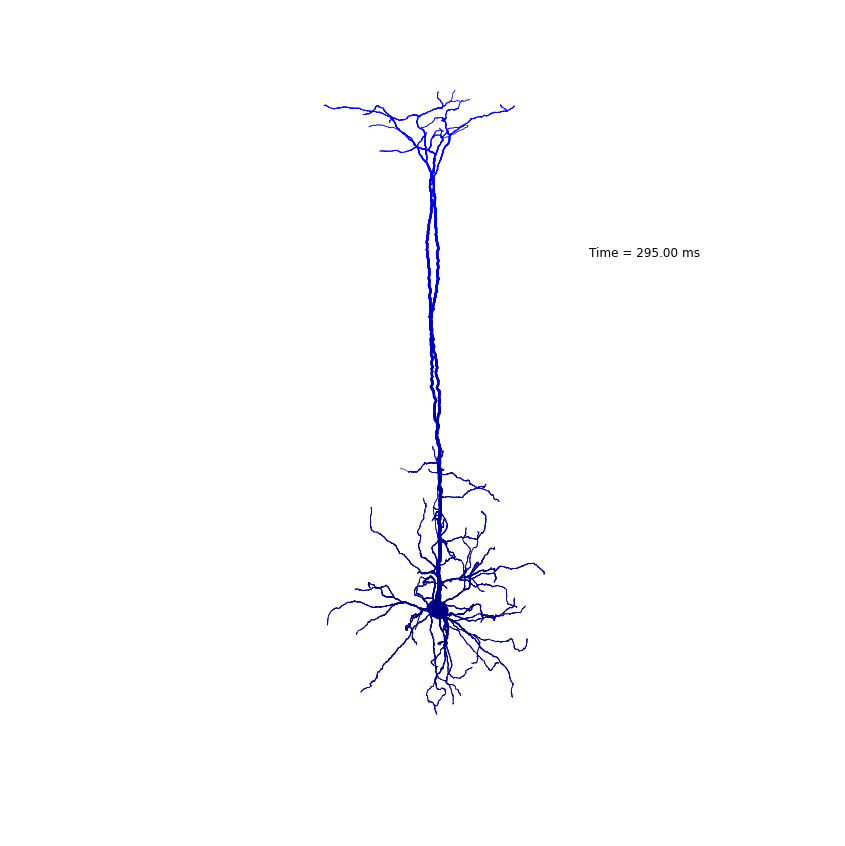
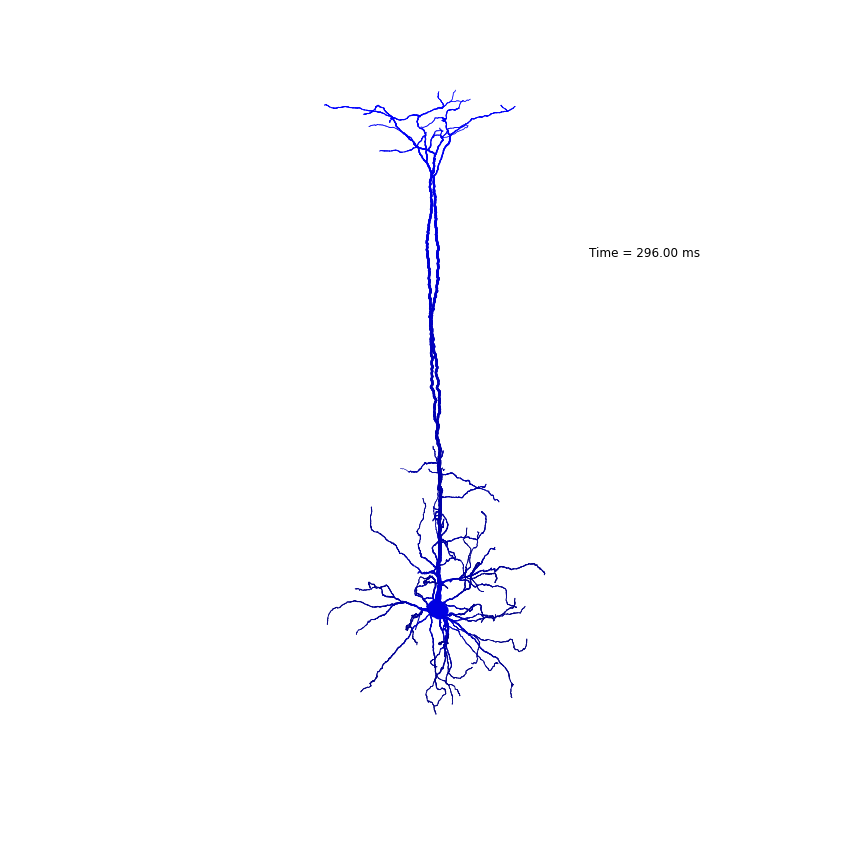
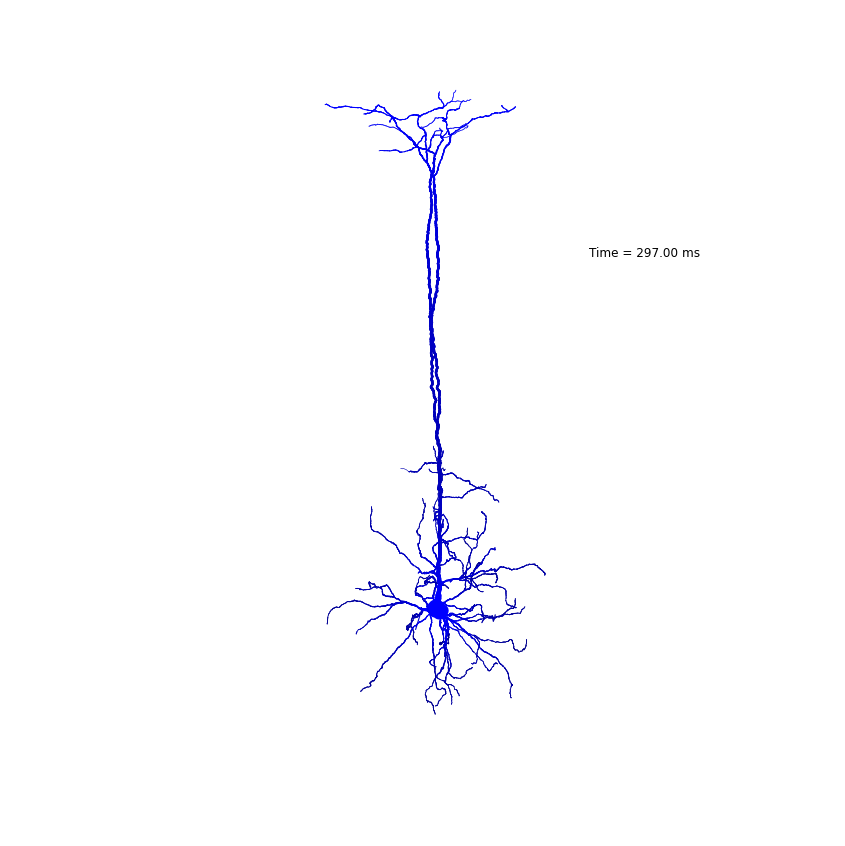
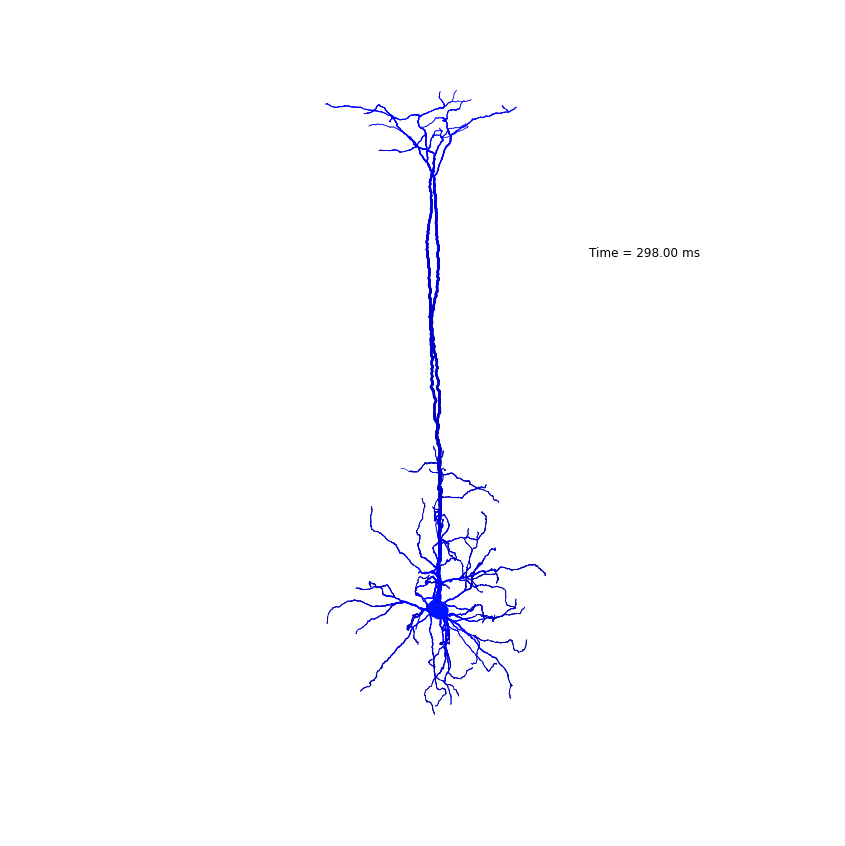
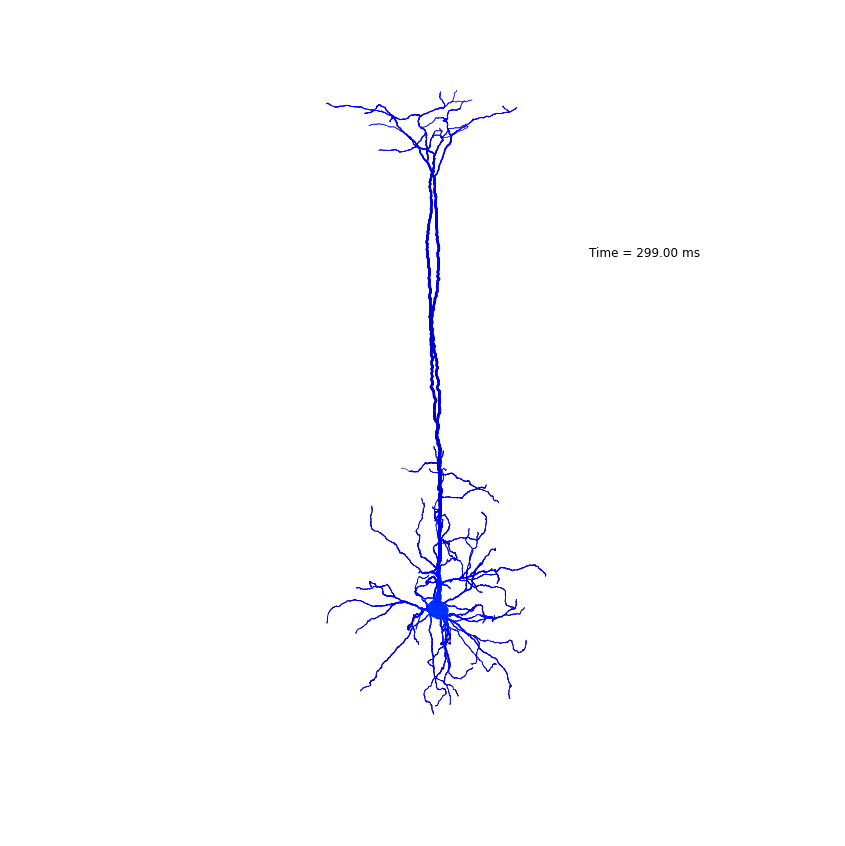
...
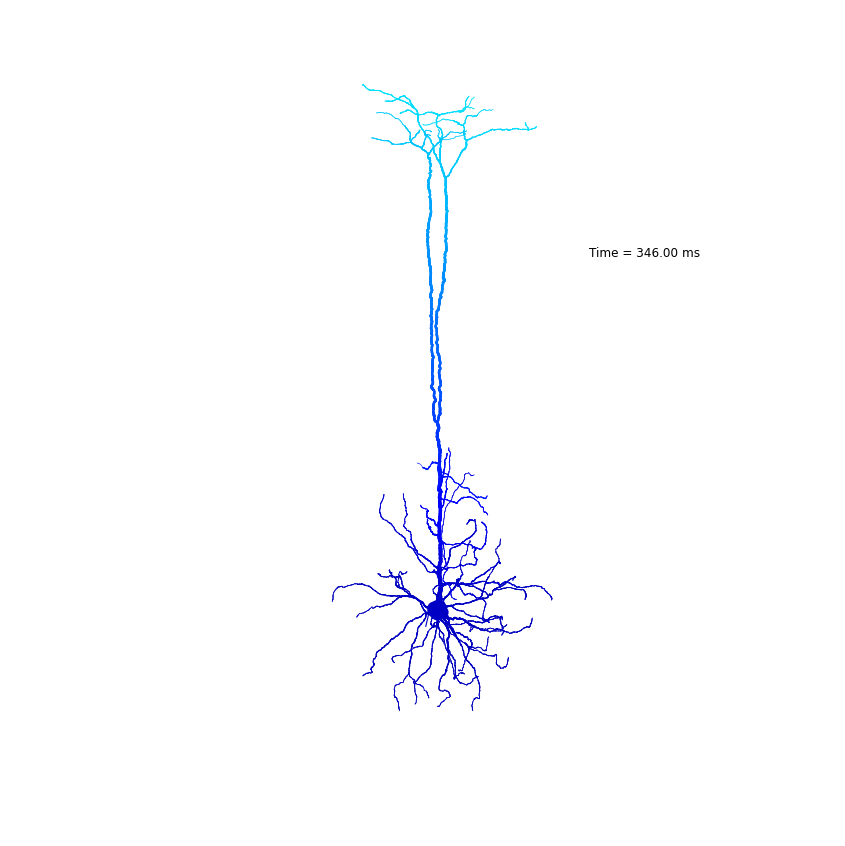
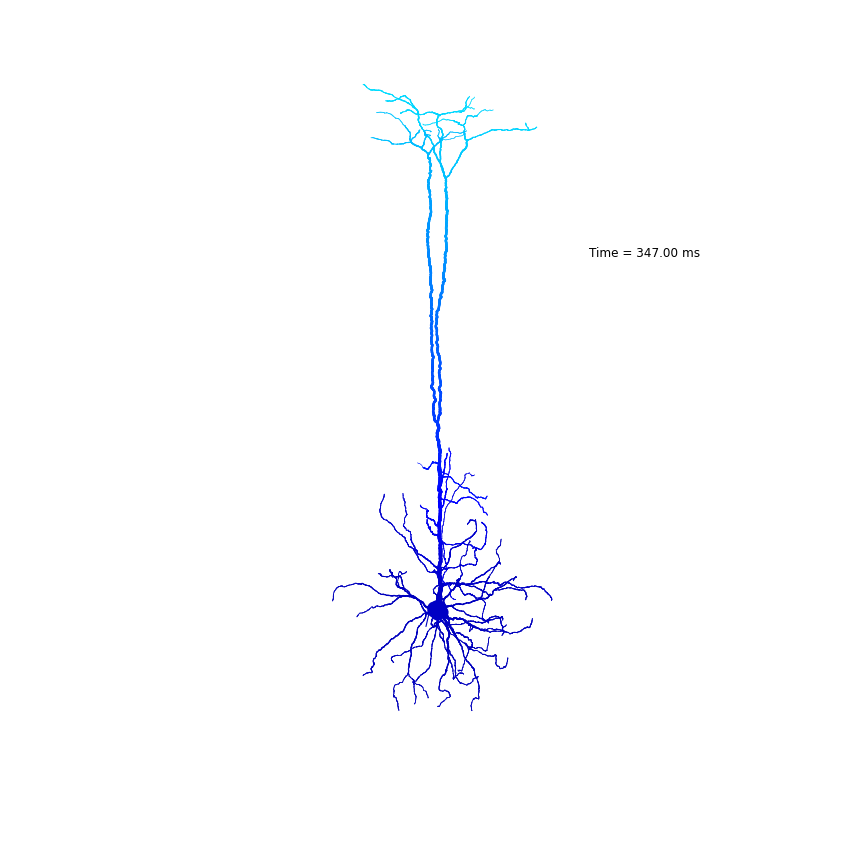
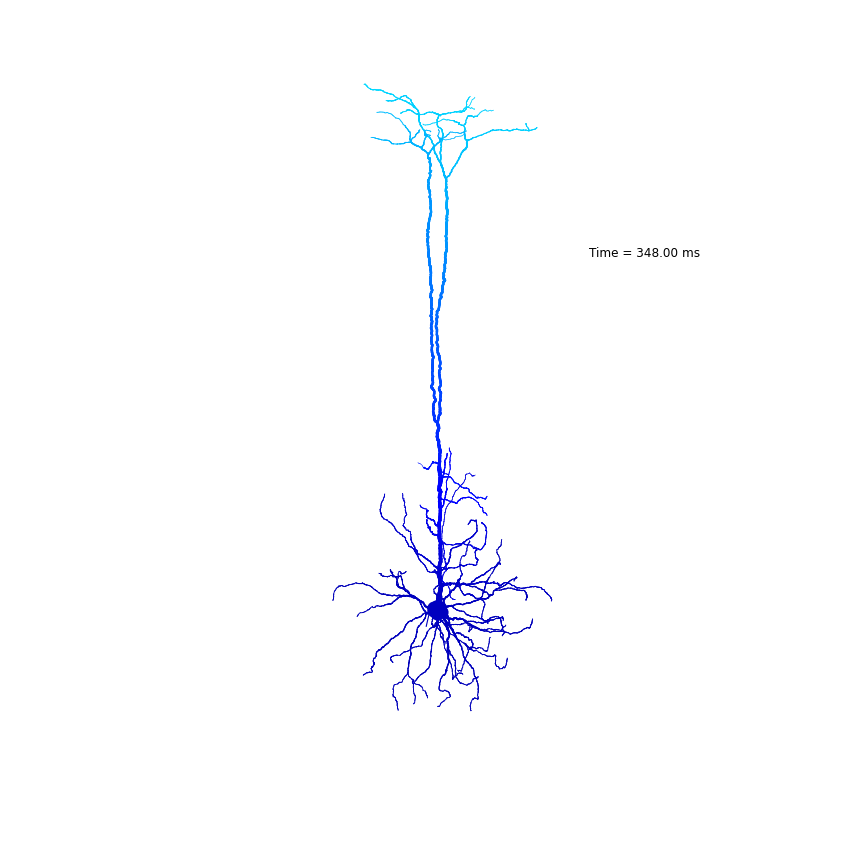
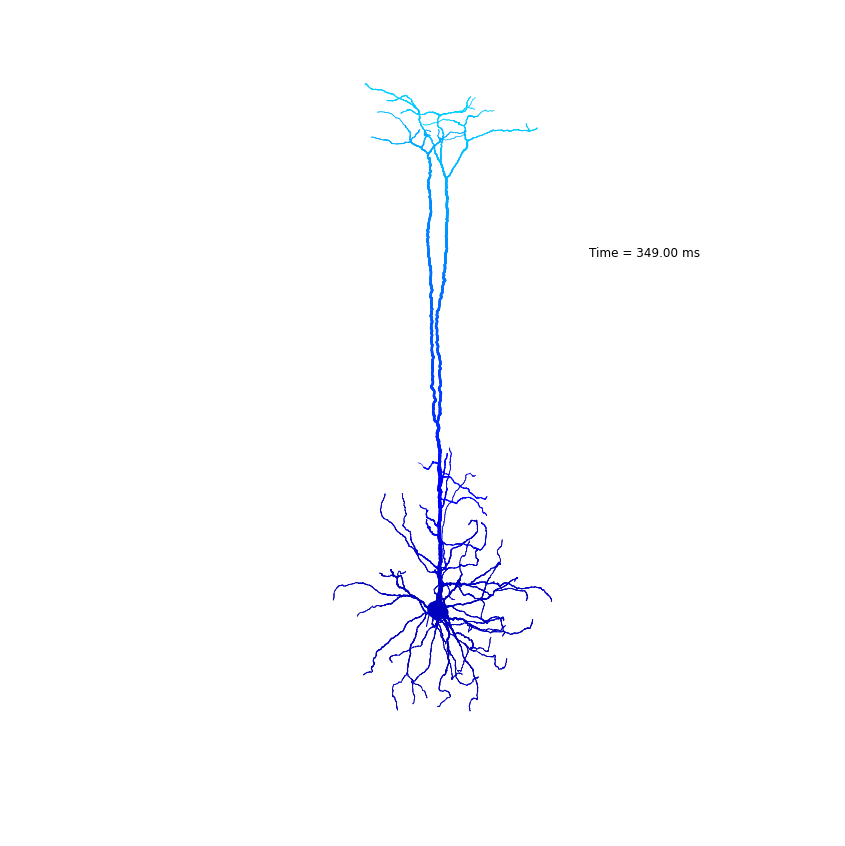
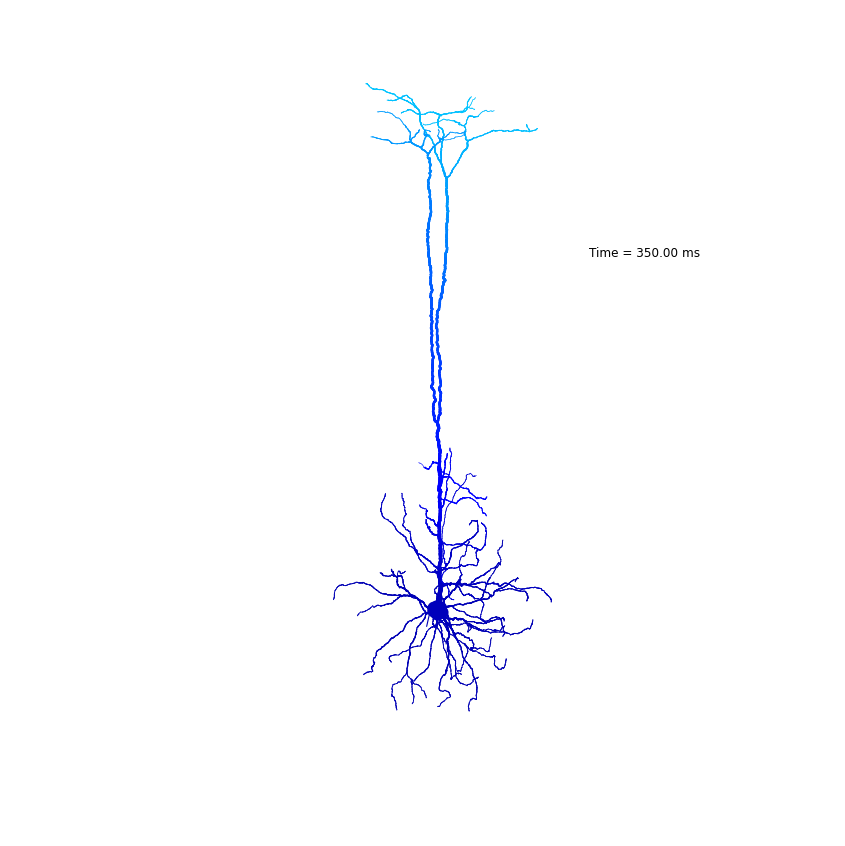

In [19]:
client = I.get_client()
outdir = I.os.path.join(db.basedir, 'burst_trail_video_3d')
    
cmv = I.CellMorphologyVisualizer(
    cell, 
    t_start=295, # Don't load all simulation data, only the interesting part
    t_stop=350, # these are in [ms]
    t_step=1)
cmv.animation(
    images_path=outdir,
    show_legend=True,
    color="voltage",
    client=client,
    overwrite_frames=True);

Or visualize current through ion channels.


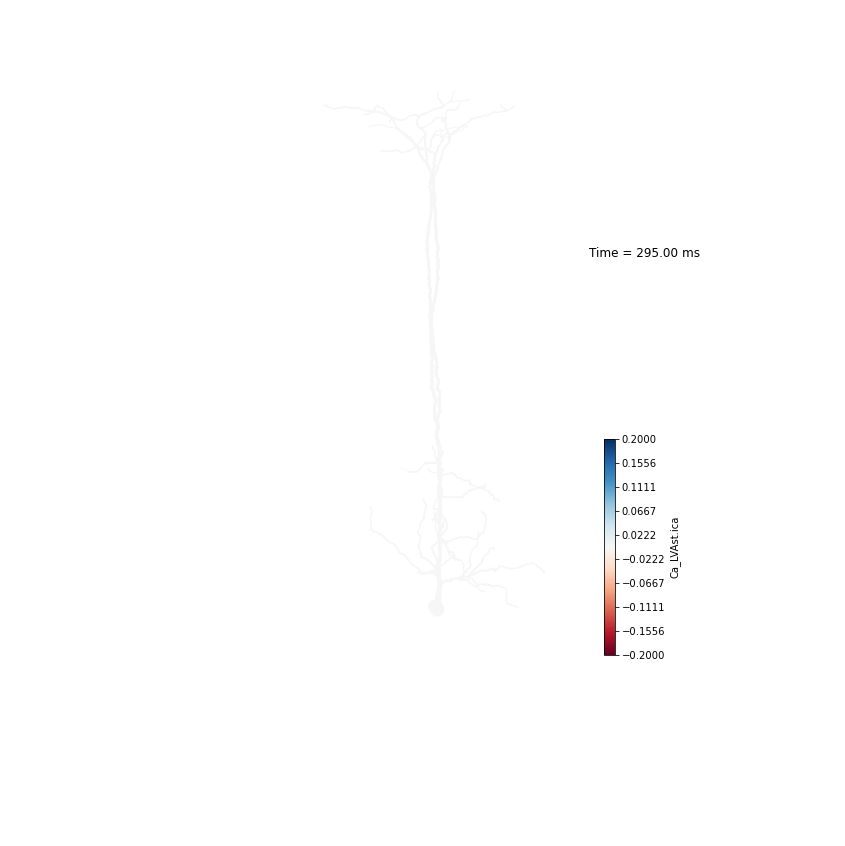
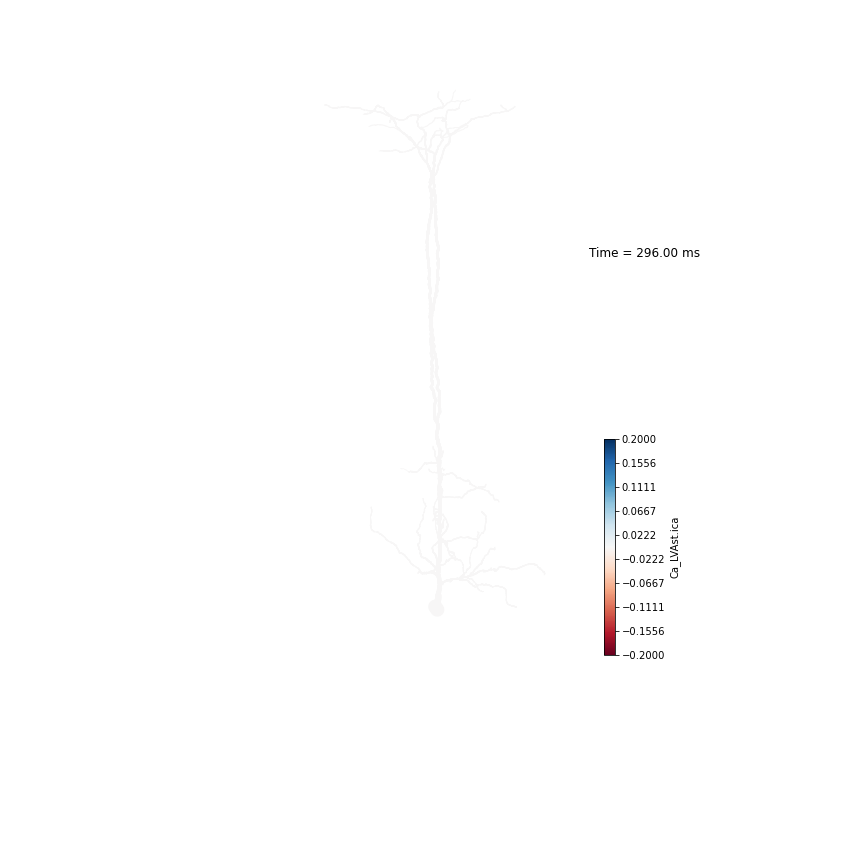
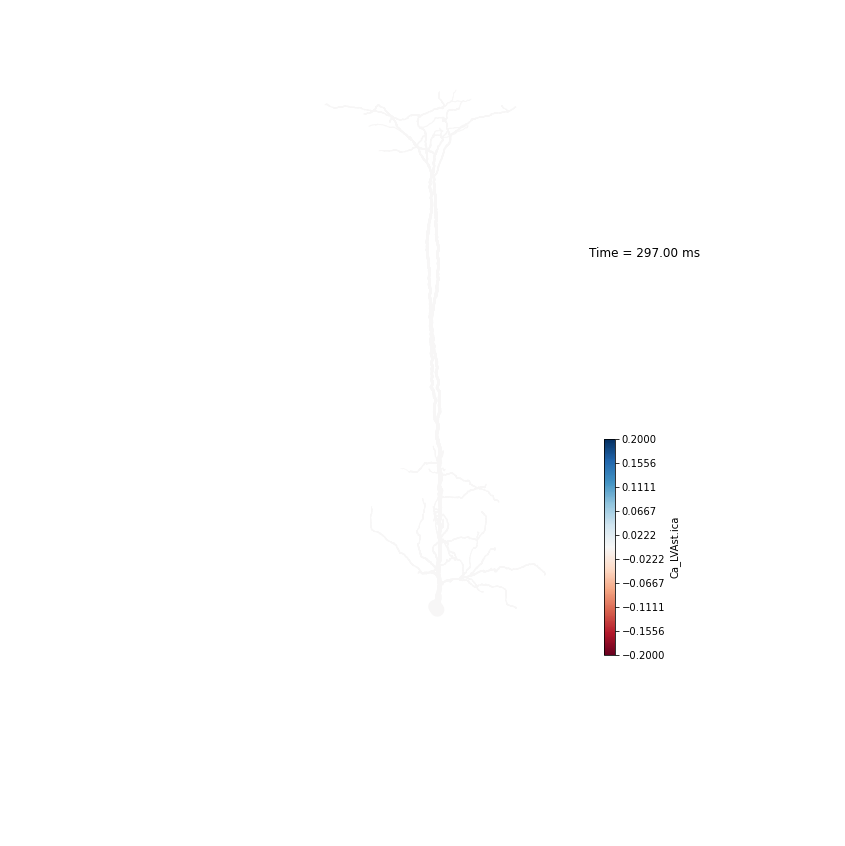
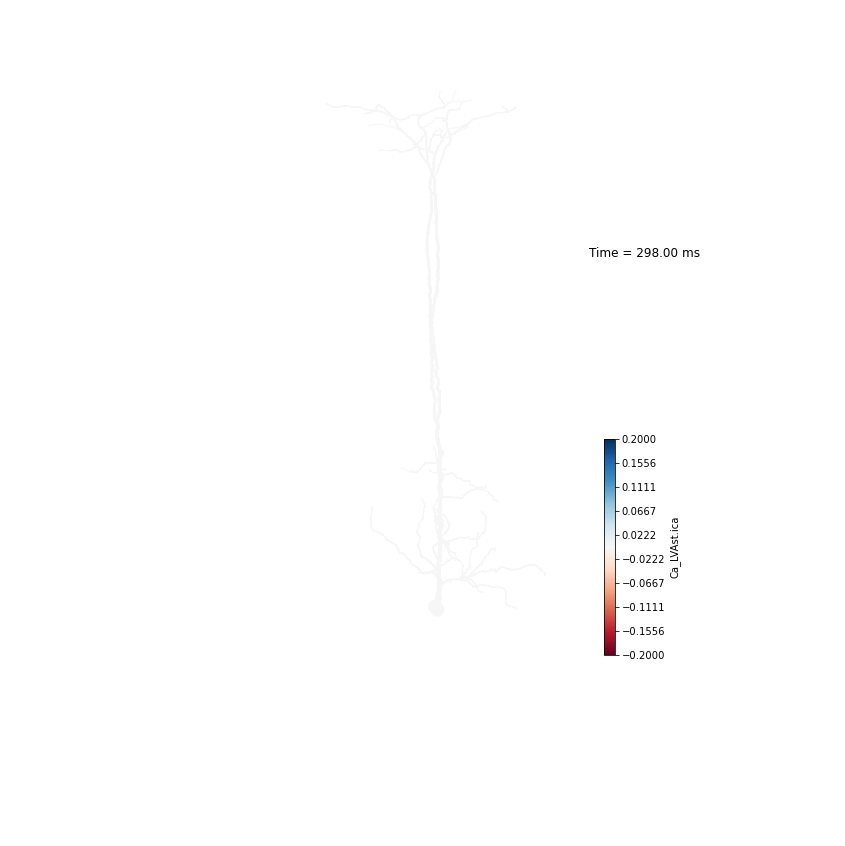
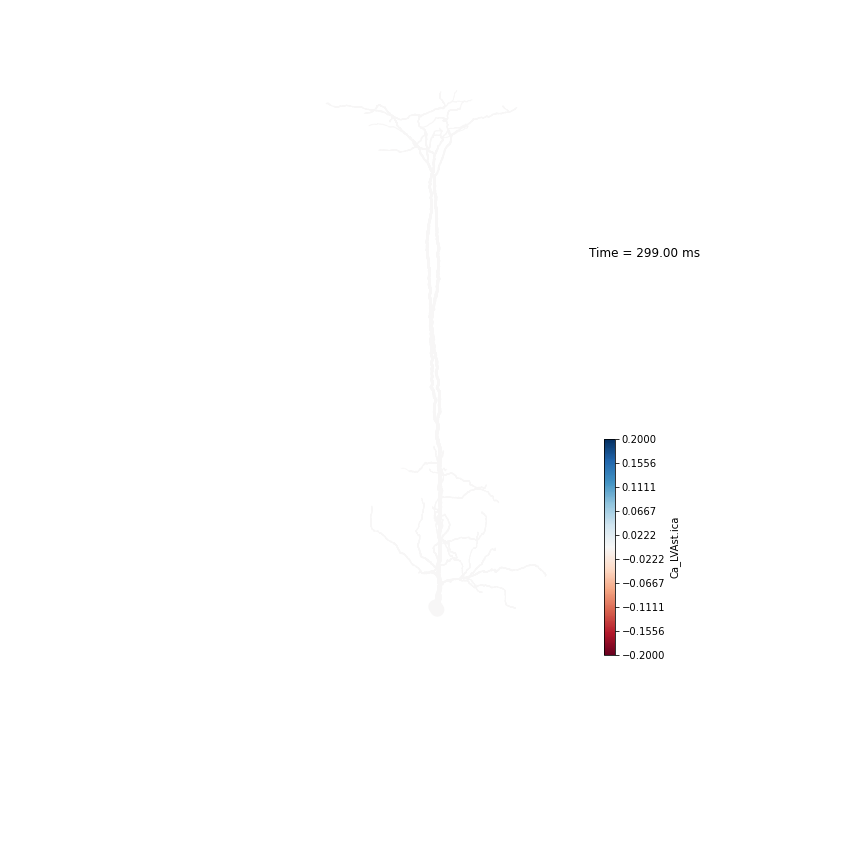
...
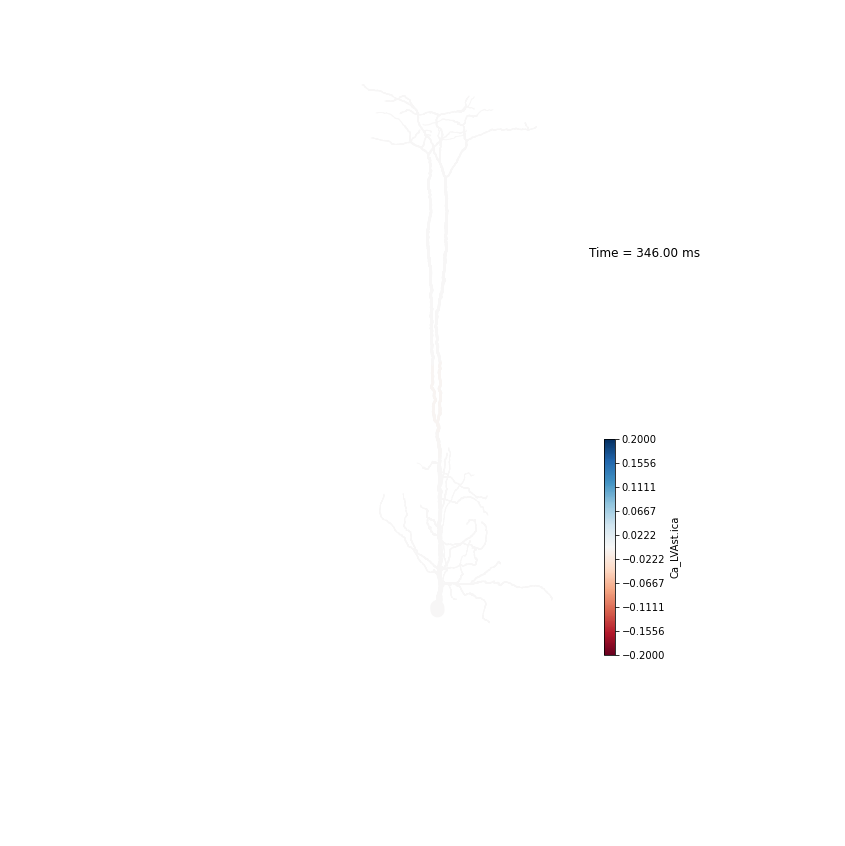
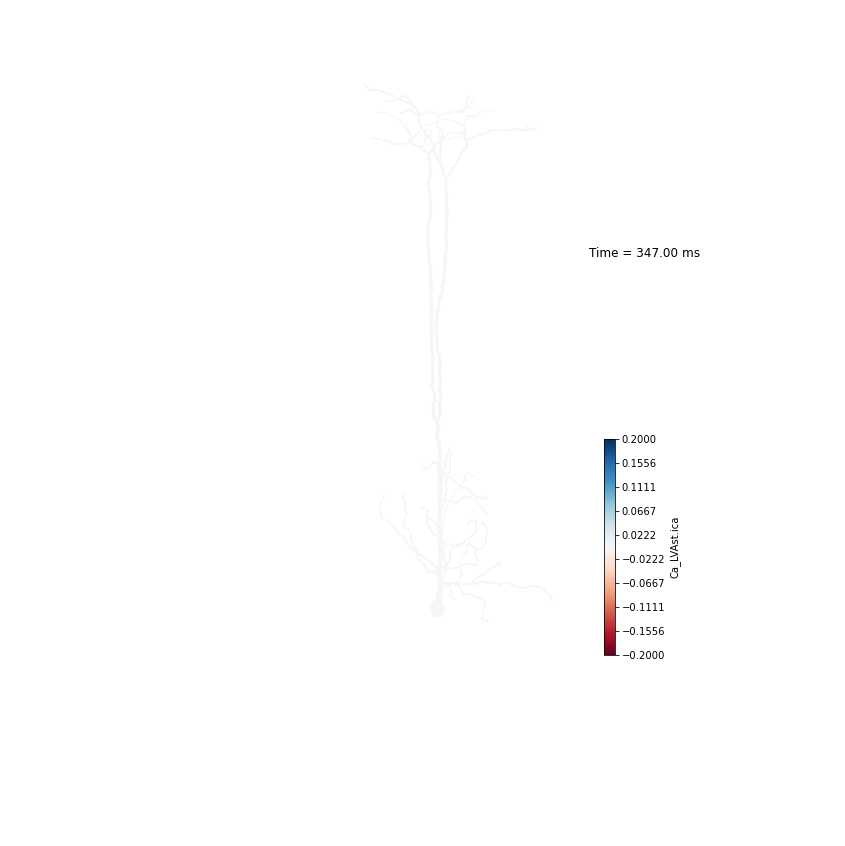
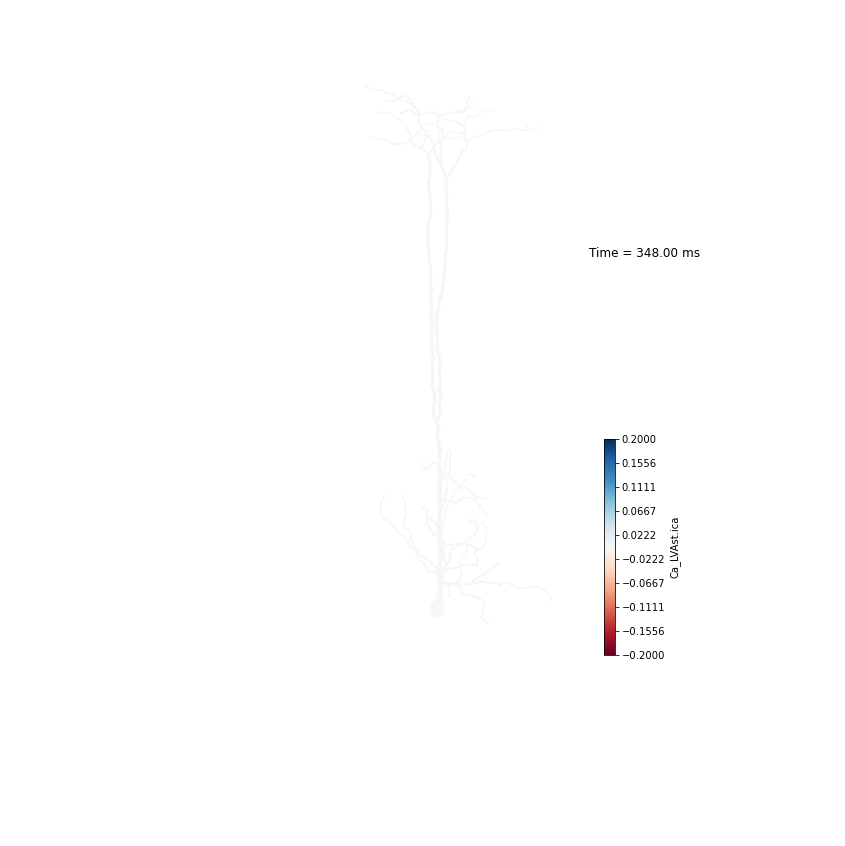
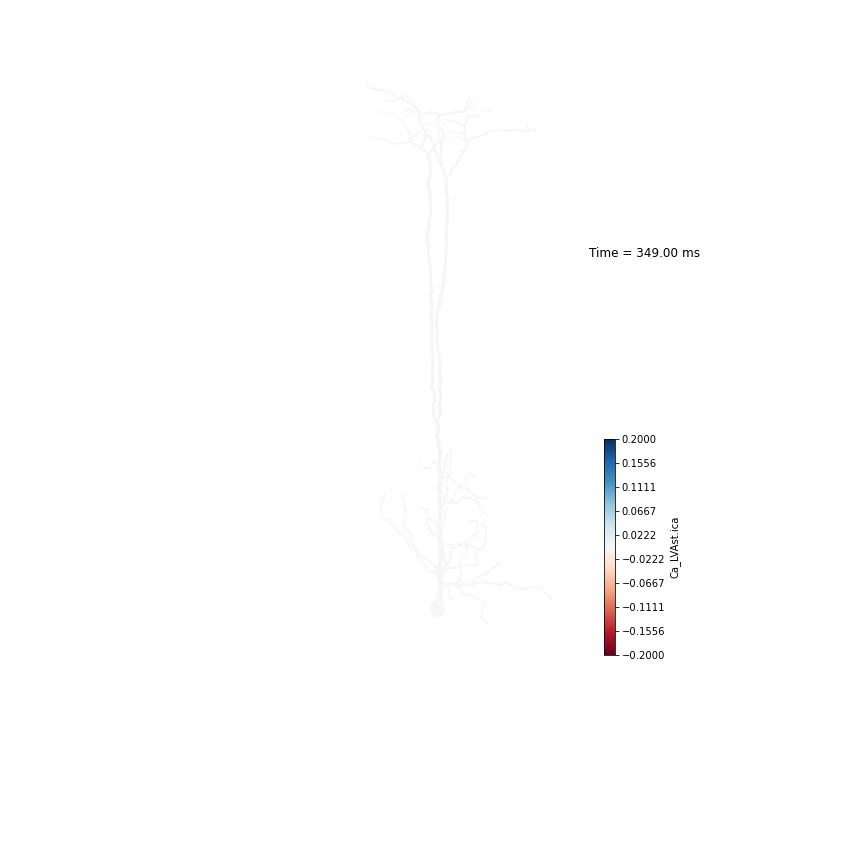
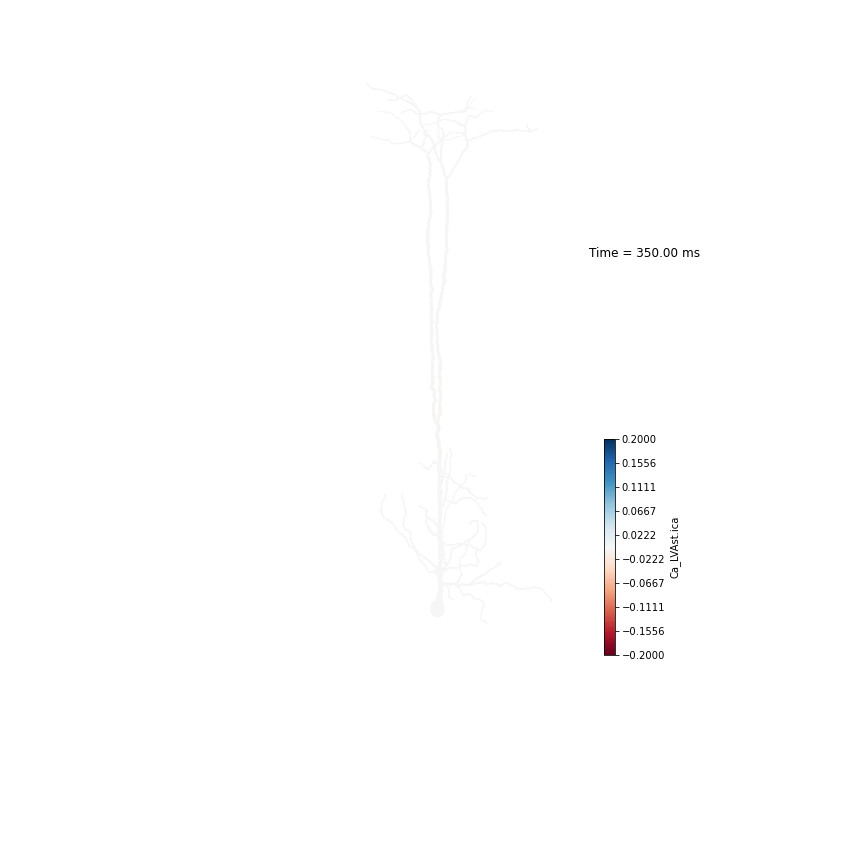

In [32]:
outdir = I.os.path.join(db.basedir, 'Ca_LVAst_video_3d')
    
cmv.set_cmap("RdBu", vmin=-2e-1, vmax=2e-1)  # more visible 
cmv.animation(
    images_path=outdir,
    color="Ca_LVAst.ica",
    show_legend=True,
    client=client,
    overwrite_frames=True);